# Visualize Traffic Accidents in UK with Datashader

by [Johnny Chan](https://github.com/Atlas7) | [GitHub Repo](https://github.com/Atlas7/visualize-traffic-accidents-in-uk) | [MIT Licence](https://opensource.org/licenses/MIT)

![datashader-uk-traffic-banner.jpg](../assets/images/datashader-uk-traffic-banner.jpg)

<a id="UK-Traffic-Accidents-Data"></a>
## UK Traffic Accidents Data

The UK government amassed traffic data for the 16 year period for 2000 to 2016, including the data on over 1.6 million accidents. This is one of the most comprehensive data sets on traffic. It's been compiled from a few UK government sources. The data used for this notebook analysis is obtained from [this Kaggle dataset - 1.6M accidents & traffic flow over 16 years - Visualise and analyse rich data on traffic demographics (version 10)](https://www.kaggle.com/daveianhickey/2000-16-traffic-flow-england-scotland-wales/version/10), containing data covering 2005-2014 (with 2008 data missing) at accident event level granularity, with the "Great Britian" (GB) scope of Scotland, England, and Wales. (Note: UK includes Northern Ireland, which is excluded from thte dataset). The data has been split into 3 chunks of CSV format flat-files, and the columns are exactly the same:

- 2005-2007 (3 years)
- 2009-2011 (3 years)
- 2012-2014 (3 years)

For our initial proof-of-concept analysis, we'll restrict our focus to only look at one of the 3-year period (for simplicity). We'll arbitrarily pick the 2005-2007 dataset which contains around 570,000 accidents (accounting to about a third of the 1.6m accidents). We'll also restrict our focus to only a small number of columns: GPS geographical coordinates (Longitude and Latitude) and day of the week - which should be enough for us to obtain a big picture of traffic accidents and answer some interesting questions. Each row of the dataset corresponds to a specific accident reported to the police.

We'll explore the use of Big Data Visualization libraries (primarily Bokeh and Datashader), as well as numerical libries (Numpy, Pandas) to dynamically aggregate and plot out vivid visualizations of traffic accident distribution. This notebook is motivated and inspired by a number of other open-source notebooks including the followings:

- [the Datashader NYC Taxi example](https://anaconda.org/jbednar/nyc_taxi/notebook)
- [the Datashader Census example](https://anaconda.org/jbednar/census/notebook)

Note that some of the interactive demos only works when run on a locally machine (e.g. dynamic aggregation and render) - when viewed on a server some of these interactive charts may be rendered as static images instead. I hope you will enjoy reading this notebook.

---

## Table of Contents

- [UK Traffic Accidents Data](#UK-Traffic-Accidents-Data)
- [The Landscape of Visualization](#The-Landscape-of-Visualization)
- [Geographical Coordinates and Map Projections](#Geographical-Coordinates-and-Map-Projections)
  - [Geographical Coordinate](#Geographical-Coordinate)
  - [Map Projection](#Map-Projection)
    - [Mercator Projection](#Mercator-Projection)
    - [Gall-Peters Projection](#Gall-Peters-Projection)
    - [We will use Web Mercator Projection](#We-will-use-Web-Mercator-Projection)
    - [Map Projection Python Packages](#Map-Projection-Python-Packages)
    - [We will use datashader mainly](#We-will-use-datashader-mainly)
- [Setup Notebook](#Setup-Notebook)
- [Import Libraries](#Import-Libraries)
- [Load CSV data into a DataFrame](#Load-CSV-data-into-a-DataFrame)
- [Obtain Web Mercator X-Y Values](#Obtain-Web-Mercator-X-Y-Values)
- [Define Bounding Box Ranges](#Define-Bounding-Box-Ranges)
- [Compute Plot Size](#Compute-Plot-Size)
- [Utility Function: get_plot_size](#Utility-Function-get_plot_size)
- [Utility Function: get_plot_params](#Utility-Function-get_plot_params)
- [Set Background Color](#Set-Background-Color)
- [Utility Functions: export and cm](#Utility-Functions-export-and-cm)
- [Make screen as big as posible (optional)](#Make-screen-as-big-as-posible-optional)
- [Traffic Accident Density](#Traffic-Accident-Density)
  - [Where were the top 1% traffic accidents reported during 2005-2007?](#top-1-pct-traffic-accidents-reported)
- [Plot Other Bounding Boxes](#Plot-Other-Bounding-Boxes)
- [Interactive Image](#Interactive-Image)
  - [Prerequisite: Enable JavaScript support](#Prerequisite-Enable-JavaScript-support)
  - [Step 1: Create Base Plot Function](#int-Step-1-Create-a-Base-Plot-Function)
  - [Step 2: Create Callback Function](#int-Step-2-Create-a-Callback-Function)
  - [Step 3: Create Interactive Plot](#int-Step-3-Create-the-Interactive-Plot)
    - [3-liner solution: good for learning](#3-liner-solution-good-for-learning)
    - [2-liner solution: more compact](#2-liner-solution-more-compact)
    - [1-liner solution: good for plotting other bounding boxes](#1-liner-solution-good-for-plotting-other-bounding-boxes)
  - [Plot other Bounding Boxes](#Plot-other-Bounding-Boxes)
  - [Adjust Plot size](#Adjust-Plot-size)
  - [Overlay data to a Terrain Map](#Overlay-data-to-a-Terrain-Map)
- [Visualize Traffic Accident Density by Road Type](#Visualize-Traffic-Accident-Density-by-Road-Type)
  - [Step 1: Define Color Key](#by-type-Step-1-Define-Color-Key)
  - [Step 2: Define Base Plot](#by-type-Step-2-Define-Base-Plot)
  - [Step 3: Define Callback Function](#by-type-Step-3-Define-Callback-Function)
  - [Step 4: Create Interactive Plot](#by-type-Step-4-Create-Interactive-Plot)
  - [Step 5: Overlay on a Map](#by-type-tep-5-Overlay-on-a-Map)
  - [Visualize other bounding boxes by Road Type](#Visualize-other-bounding-boxes-by-Road-Type)
- [Conclusion](#Conclusion)
- [What Next](#What-Next)

---

<a id="The-Landscape-of-Visualization"></a>
## The Landscape of Visualization

A question we often ask ourselves is: **so many visualization framworks, which one to choose?**

Jake VanderPlas [gave a really good talk on the Python Visualization Landscape at PyCon 2017](https://www.youtube.com/watch?v=FytuB8nFHPQ). This slide paints a high-level big picture of the current Python Visualization frameworks arranged in clusters according to similarities and the problems they try to solve. (I would recommend you to watch the video yourself for more info).

![py-vis-landscape-jake-vanderplas.png](../assets/images/py-vis-landscape-jake-vanderplas.png)

We've chosen the Datashader and Bokeh combo mainly due to their strengths in solving big data visualization problems. [This PyCon talk by Peter Wang - Interactive Viz of a Billion Points with Bokeh Datashader](https://www.youtube.com/watch?v=fB3cUrwxMVY) will provide more insights on this.

Side note: there is a framework called [Holoview](http://holoviews.org/) which is designed to make data analysis and visualization seamless and simple - we will not be covering Holoview in this Notebook but it is certainly something we should explore later on.

<a id="Geographical-Coordinates-and-Map-Projections"></a>
## Geographical Coordinates and Map Projections

Before digging into the actual data and code it is important to appreciate the difference between the concept of [Geographical Coordinate](https://blog.eogn.com/2014/09/16/convert-an-address-to-latitude-and-longitude/) and [Map Projection](https://en.wikipedia.org/wiki/Map_projection). Geographical Coordinate pin points a location on the 3D Earth Surface, whereas Map Projection "projects" the 3D Earth geometry onto a 2D surface (for ease of interpretation, printing out on a paper / displaying on a monitor, etc). This chapter will prepare you the fundamentals that will be useful for the map plotting activities later on.

<a id="Geographical-Coordinate"></a>
### Geographical Coordinate

[Geographical Coordinate](https://en.wikipedia.org/wiki/Geographic_coordinate_system) pin-points an exact location on the 3D spherical Earth surface, represented by a longitude, latitude, and elevation. If you have never heard of Longitude/Latitude, or require some quick memory refresh, I highly recommend [this article by Dick Eastman](https://blog.eogn.com/2014/09/16/convert-an-address-to-latitude-and-longitude/). Quoting the article:

> The coordinates are similar to the Xs and Ys you used to plot in algebra class. Imagine if the surface of the Earth could be stretched flat. Then suppose you place a grid on top of the flattened world. You could pin-point any location by finding the spot where the horizontal and vertical grid lines intersect. The horizontal x-axis is the equator, while the vertical y-axis is the Prime Meridian, which runs through the Greenwich Observatory in England.

The geographical coordinate of a point is represented by a tuple that looks like this:

```
(longitude, latitude, elevation)
```

- [Longitude](https://en.wikipedia.org/wiki/Longitude) ranges between -180 degrees and +180 degrees along the equator. When you are at the **Prime Meridian** you are at Longitude of 0 degrees.
- [Latitude](https://en.wikipedia.org/wiki/Latitude) ranges between -90 degrees (south pole) and +90 degree (north pole). When you are at the **Equator** you are at Latitude of 0 degrees.
- [Elevation](https://en.wikipedia.org/wiki/Elevation) of a geographic location is its height above or below a fixed reference point, most commonly a reference geoid. **For the Traffic dataset we only have longitude and latitude information. We can safely elevation for now.**

| ![Latitude-and-longitude-2.jpg](../assets/images/Latitude-and-longitude-2.jpg) |
|:--:|
| [Image Source: eogn.com](http://eogn.com/images/newsletter/2014/Latitude-and-longitude.png) |

<a id="Map-Projection"></a>
### Map Projection

Whilst a geographical coordinate pin-points a location on the 3D Earth surface, we often need to project that coordinate on a 2D map. The transformation from a 3D coordinate system to a 2D "paper-like" surface is called **Map Projection**.

Map Projection is a big subject on its own and I would recommend you to have a quick skim through the [Wikipedia Page on Map Projection](https://en.wikipedia.org/wiki/Map_projection) and get familiar. There is also a [great YouTube video](https://www.youtube.com/watch?v=kIID5FDi2JQ) describing Map Projection and explaining "why all world maps are wrong". The most important take-away is that **there is no best map projection** - use whatever that suits your purpose well.

I would like to however discuss two major map projections here: the [Mercator Projection](#Mercator-Projection) and [Gall-Peters Projection](#Gall-Peters-Projection).

<a id="Mercator-Projection"></a>
#### Mercator Projection

The most seen map projections is the [Mercator Projection](https://en.wikipedia.org/wiki/Mercator_projection). It looks something like this.

| ![Mercator_projection_SW.jpg](../assets/images/Mercator_projection_SW.jpg) |
|:--:|
| [Image Source: Wikipedia](https://en.wikipedia.org/wiki/Mercator_projection#/media/File:Mercator_projection_SW.jpg) |

Its main strength is its ability to maintain shape of countries from severe distortions. It contains realistic angles for navigation purposes (e.g. 45% on a Mercator map does indeed represents a right angle from a human navigator's perspective). Its main limitation is its inability to represent size of areas - [this great article](http://mentalfloss.com/article/57050/actual-size-greenland) illustrates the Mercator vs Actual size og Iceland in comparison to Africa.

One of the most wildly supported Mercator variants is called [Web Mercator Projection](https://en.wikipedia.org/wiki/Web_Mercator), which is used by online Map services including [Google Map](https://www.google.co.uk/maps), [Bing Map](https://www.bing.com/maps), and [Open Street map](https://www.openstreetmap.org/).

This [epsg.io 3857 Web Mercator app](https://epsg.io/map#srs=3857&x=0.000000&y=-0.000000&z=1) is also very handy - dragging the point to various location on the Web Mercator map you can instantly find your Web Mercator X and Y values. If you move around the map you will notice something:

- The unit of Web Mercator Coordinate is measured in meters. [See this Stackoverflow forum](https://gis.stackexchange.com/questions/242545/how-can-epsg3857-be-in-meters)
- The map spans from -20037508.342789 meters to +20037508.342789 in both `x` and `y` directions. With the Origin `(0, 0)` Intersecting the Equator and the Prime Meridian. i.e. Longitude 0 and Latitude 0.
- x-axis is similar to the longitude, y axis is similar to going along the latitude. (note: similar only. not the same).

**In this notebook we will primarily use Web Mercator Projection motivated by its familarity and ease of interpretation**.

![espg-io-mercator](../assets/images/espg-io-mercator.png)

<a id="Gall-Peters-Projection"></a>
#### Gall-Peters Projection

[Galls-Peters Projection](https://en.wikipedia.org/wiki/Gall%E2%80%93Peters_projection) is similar to Mercator, except it distorts the Mercator Projection a bit more to better represent land areas. Notice this time the land areas are more realistic - note that Iceland this time is much smaller than Africa now as we should expect. The trade-off is distored country shapes. This projection may be more useful if the priority is to visualize and compare sizes of each country, without caring too much about contry shapes. **We won't be using Gall-Peters Projection in this Notebook**.

| ![Gall–Peters_projection_SW.jpg](../assets/images/Gall–Peters_projection_SW.jpg) |
|:-:|
| [Image Source: Wikipedia](https://upload.wikimedia.org/wikipedia/commons/3/34/Gall%E2%80%93Peters_projection_SW.jpg) |

<a id="We-will-use-Web-Mercator-Projection"></a>
#### We will use Web Mercator Projection

No map projection is perfect. But as I assume most of us in the world (including those from outside the UK) use Google Maps and familiar with the Web Mercator Map Projection style, I've made the decision of using Web Mercator Projection as our default Map projection style in our notebooks.

I've also observed that most (if not all) major Python packages support the Web Mercator Projection (e.g. transforming (and rendering) Longitudes and Latitudes into Web Mercator X and Y values, and so we believe it is a sound choice from a technology availability perspective - at least for getting started.

<a id="Map-Projection-Python-Packages"></a>
#### Map Projection Python Packages

Here are some existing Python packages on creating / rendering web projections.

Creating Mercator Projection Values from Geo Coordinates:

- [Datashader utils](https://github.com/bokeh/datashader/blob/master/datashader/utils.py): `the datashader.utils.lnglat_to_meters` function converts a Longitude-Latitude pair into Web Mercator X-Y value pairs.

On Rendering Mercator Projection Values:

- [Datashader](https://bokeh.github.io/datashader-docs/getting_started/1_Introduction.html): Datashader understands Mercator Projection.
- [Bokeh](https://bokeh.pydata.org/en/latest/docs/user_guide/geo.html): "Bokeh plots can also consume XYZ tile services which use the Web Mercator projection."
- [Geoviews + Bokeh/Matplotlib](http://geo.holoviews.org/Projections.html): take in Longitude-Latitude pairs and render directly to any Map projectins. Geoviews is built on Holoviews. "The Bokeh backend currently only supports one output projection (web Mercator), but with the matplotlib backend you can choose between any of the available cartopy projections:"

```
projections = [crs.RotatedPole, crs.Mercator, crs.LambertCylindrical, crs.Geostationary, 
               crs.AzimuthalEquidistant, crs.OSGB, crs.EuroPP, crs.Gnomonic, crs.PlateCarree, 
               crs.Mollweide, crs.OSNI, crs.Miller, crs.InterruptedGoodeHomolosine,
               crs.LambertConformal, crs.SouthPolarStereo, crs.AlbersEqualArea, crs.Orthographic,
               crs.NorthPolarStereo, crs.Robinson]
```

| ![geoview-projections.jpg](../assets/images/geoview-projections.jpg) |
|:-:|
| [Image Source: holoviews.org](http://geo.holoviews.org/Projections.html) |

<a id="We-will-use-datashader-mainly"></a>
#### We will use datashader mainly

For this note book analysis we will use Datashader for creating and rendering Mercator Projection. Geoview is an interesting one and we may well explore it in a separate notebook.

<a id="Setup-Notebook"></a>
## Setup Notebook

In [1]:
# This is a bit of magic to make matplotlib figures appear inline in the notebook
# rather than in a new window.
%matplotlib inline

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

<a id="Import-Libraries"></a>
## Import Libraries

We will be using a bunch of readily available visualization libraries - primarily with `bokeh` and `datashader`.

In [2]:
# Standard Python built-in libraries
from functools import partial

# Numerical libraries
import numpy as np
import pandas as pd

# Datashader Big Data Visualization
import datashader as ds
from datashader import transfer_functions as tf

# Convert Longitude-Latitude coordinates into Web Mercator X-Y Values
from datashader.utils import lnglat_to_meters as webm

# Export a datashader plot to an image file (e.g. jpg/png)
from datashader.utils import export_image

# Color Maps
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from matplotlib.cm import hot
from colorcet import fire

# Interactive images
from bokeh.plotting import figure, output_notebook, show
from datashader.bokeh_ext import InteractiveImage

# Overlay our data on a Real Map
from bokeh.tile_providers import STAMEN_TERRAIN

<a id="Load-CSV-data-into-a-DataFrame"></a>
## Load CSV data into a DataFrame

**For simplicity we will use pandas to load CSV for now**. If we are on a Big Data / distributed environment, consider using [Dask](http://dask.pydata.org/) dataframe structure. Dask is similar to [Pandas](https://pandas.pydata.org/), but with extra support for distributed or out-of-core (larger than memory) operation.

Each row in the dataset corresponds to an accident reported. For our getting-started analysis we will pick out only a small number of columns: `Longitude`,`Latitude`, and `Road_Type`.

In [3]:
%%time
# Note: you'd have downloaded the CSV file from Kaggle already, and placed it at the `../input` directory.
# If not, do it manually before running this step.
# https://www.kaggle.com/daveianhickey/2000-16-traffic-flow-england-scotland-wales/version/10
df = pd.read_csv(
  '../input/accidents_2005_to_2007.csv',
  usecols=['Longitude','Latitude', 'Road_Type'])

CPU times: user 1.01 s, sys: 60.6 ms, total: 1.07 s
Wall time: 1.07 s


In [4]:
# take a peek
df.tail()

,Longitude,Latitude,Road_Type
570006,-3.210294,54.985289,Single carriageway
570007,-3.193693,54.984105,Single carriageway
570008,-2.992068,55.166369,Single carriageway
570009,-3.058338,54.995154,Single carriageway
570010,-3.348857,55.104618,Single carriageway


In [5]:
# how many rows and columns?
df.shape

(570011, 3)

There are around 570k rows in this dataframe (one per accident counted). We also need to make sure our data types are correct. If not, correct it.

In [6]:
# Take a peek of datatypes
df.dtypes

Longitude    float64
Latitude     float64
Road_Type     object
dtype: object

`Road_Type` by default is imported as `object` datatype. In order for the `datashader` dynamic aggregation by category to work we need to manually change it to `categorical` (otherwise the downstream datashader plots won't work). Let's quickly convert the datatypes into `category`.

In [7]:
df['Road_Type'] = df['Road_Type'].astype('category')
df.dtypes

Longitude     float64
Latitude      float64
Road_Type    category
dtype: object

In [8]:
# take a peek at Road_Type values & count
df.groupby(['Road_Type']).size()

Road_Type
Dual carriageway       87274
One way street         12434
Roundabout             36637
Single carriageway    423414
Slip road               5936
Unknown                 4316
dtype: int64

<a id="Obtain-Web-Mercator-X-Y-Values"></a>
## Obtain Web Mercator X-Y Values

The traffic data we obtain contains the geographical coordinates `Longitude` and `Latitude`. In order to project onto a 2D Web Mercator map later, we need to compute the Web Mercator X-Y values (from `Longitude` and `Latitude` values). Fortunately we've imported a handy utility `webm` that can easily convert `Longitude` and `Latitude` into Web Mercator `x` and `y` values. to do this. (see the [Import Libraries](#Import-Libraries)).

In [9]:
# computer Mercator x and y values from Longitude and Latitude
x, y = [c for c in list(webm(df.loc[:, 'Longitude'], df.loc[:, 'Latitude']))]

# add as new columns called `webm_x` and `webm_y `in our dataframe df
df = df.assign(webm_x=x).copy()
df = df.assign(webm_y=y).copy()

# take a peek
df.tail()

,Longitude,Latitude,Road_Type,webm_x,webm_y
570006,-3.210294,54.985289,Single carriageway,-357368.293377,7.359012e+06
570007,-3.193693,54.984105,Single carriageway,-355520.278510,7.358782e+06
570008,-2.992068,55.166369,Single carriageway,-333075.486179,7.394222e+06
570009,-3.058338,54.995154,Single carriageway,-340452.628834,7.360926e+06
570010,-3.348857,55.104618,Single carriageway,-372793.055979,7.382197e+06


Note our newly computed Web Mercator X-Y values `webm_x` and `webm_y`. If you type a couple of `webm_x` and `webm_y` values in [this espg.io Mercator Map](https://epsg.io/map#srs=3857&x=0.000000&y=-0.000000&z=2) you will find that these points are indeed, in the UK.

![dpsg-io-uk-1.png](../assets/images/dpsg-io-uk-1.png)

<a id="Define-Bounding-Box-Ranges"></a>
## Define Bounding Box Ranges

The purpose of a bounding box is to define the area of the map region to plot. Here we will create some geographic bounding boxes, defined by Longitudes and Latitudes. Once defined we will be able to convert to Mercator values programmatically and project the bounding box on a 2D Mercator Map.

[Open Street Map](https://www.openstreetmap.org) is a handy tool that gives us the bounding box values (in Longitude and Latitude ranges). This is how we will obtain some bounding boxes manually. Go to Click the export button (or click [this link](https://www.openstreetmap.org/export)), and then click "Manually select a different area":

![open-street-map-bbox.jpg](../assets/images/open-street-map-bbox.jpg)

Drag the corners to get the area you desire. Feel free to zoom in and out to get the level zom you want. You will see the Longitude and Latitude ranges displayed on the left:

![open-street-map-uk.jpg](../assets/images/open-street-map-uk.jpg)

![open-street-map-bbox-uk.jpg](../assets/images/open-street-map-bbox-uk.jpg)

For this Britian example, we have just obtained our bounding box, which can be stored as a tuple like this:

```
bounding_box = (longitude_range, latitude_range)
             = ((-15.381, 7.251), (48.749, 61.502))
```

We can also do the same for other major areas of interests such as London, Manchester, etc. Now we know how to obtain bounding box from Open Street Map (manually), we can store these bounding boxes `bboxes` in a Python `dict`:

In [10]:
# in lng/lats, manually obatained from Open Street Map
# https://www.openstreetmap.org/export
# feel free to add some of your own!
bboxes = {
  "gb": ((-15.381, 7.251), (48.749, 61.502)),
  "gb_mainland": ( (-12.129, 5.120), (49.710, 58.745)),
  "gb_long": ((-8.745, 2.241), (48.749, 61.502)),
  "gb_wide": ((-21.709, 15.293), (48.749, 61.502)),
  "london": ((-0.643, 0.434), (51.200, 51.761)),
  "london_2": ((-0.1696, 0.0130), (51.4546, 51.5519)),
  "london_3": ((-0.1330, -0.0235), (51.4741, 51.5322)),  
  "manchester": ((-3.049, -1.505), (52.975, 53.865))
 }


We can obtain our bounding box ranges in either Longitude-Latitude or Web Mercator Projection values like this:

In [11]:
# bounding box in longitude_range and latitude_range
bboxes["gb"]

((-15.381, 7.251), (48.749, 61.502))

In [12]:
# bounding box in Web Mercator x_range and y_range
webm(*bboxes["gb"])

(array([-1712205.08789134,   807177.62774203]),
 array([ 6232378.76591682,  8742012.04392761]))

Here, we find that the Mercator Projection X-Y ranges are:

```
x_range: (-1712205.08789134, 807177.62774203)
y_range: (6232378.76591682, 8742012.04392761)
```

If you cross check the [lower left point](https://epsg.io/map#srs=3857&x=-1712205.087891&y=6232378.765917&z=3) and [upper right point](https://epsg.io/map#srs=3857&x=807177.62774203&y=%208742012.04392761&z=3) on the [epsg.io Mercator Map tool](https://epsg.io/map#srs=3857), you will see that the bounding range does indeed cover Britian.


![open-street-map-bbox-uk-2.jpg](../assets/images/open-street-map-bbox-uk-2.jpg)

![open-street-map-bbox-uk=3.jpg](../assets/images/open-street-map-bbox-uk-3.jpg)


<a id="Compute-Plot-Size"></a>
## Compute Plot Size

First of all, we need to have a mental image of two rectanges: the Web Mercator Map measured in meters, and our plot in pixels. Both should have the same width (x) to height (y) ratios. Concretely, we've drawn this diagram:

![plot_ratio.png](../assets/images/plot_ratio.png)

We already know our `x_range` and `y_range` for the Web Mercator Map (in meters). For our plot, we can manually set our `plot_width` (in pixels) to say, `750` (pixels) to suit most computer monitors. We now have an equation with 3 known variables and one unknown `plot_height`, which we can compute with a bit of high school maths.

```
plot_height = (y_range / x_range) * plot_width
            = y_range * plot_width / x_range
```

<a id="Utility-Function-get_plot_size"></a>
### Utility Function: get_plot_size

In [13]:
# set default plot width (we compute the plot height)
PLOT_WIDTH = 750

# Create a utiliy function to dynamically compute plot_height
def get_plot_size(x_range, y_range, plot_width=PLOT_WIDTH):
  """returns plot size in pixels, given x_range, y_range, and a desired plot_width"""
  # compute X and Y distances  
  x_range_dist = x_range[1] - x_range[0]
  y_range_dist = y_range[1] - y_range[0]
  plot_height = int(y_range_dist * plot_width /x_range_dist)
  
  return (plot_width, plot_height)

In [14]:
# for our britian example, this is how we get our bounding box in different formats
# Note our use of tuple destructuring (with the *)
print("Britian Bounding Box")
print("  - in lng/lat ranges: {}".format(bboxes["gb"]))
print("  - in Web Mercator X-Y ranges: {}".format(webm(*bboxes["gb"])))
print("  - in Plot width-height: {}".format(get_plot_size(*webm(*bboxes["gb"]))))

Britian Bounding Box
  - in lng/lat ranges: ((-15.381, 7.251), (48.749, 61.502))
  - in Web Mercator X-Y ranges: (array([-1712205.08789134,   807177.62774203]), array([ 6232378.76591682,  8742012.04392761]))
  - in Plot width-height: (750, 747)


As we will be focusing on just Britian for a while, let's cache our Web Mercator and Plot values so we won't need to specify it every single time. Whenever need to move on our next point of interest (e.g. London, Manchester, etc), we will re-computer these values.

<a id="Utility-Function-get_plot_params"></a>
### Utility Function: get_plot_params

We will soon notice that, given a bounding box, the 4 most important and used variables are `x_range`, `y_range`, `plot_width`, `plot_height`. Let's create a utility function to compute these variables in one go, given a bounding box (`bbox`) and manually defined `plot_width`.

In [15]:
# create a utility function so we can reuse easily later
def get_plot_params(bbox, plot_width=PLOT_WIDTH):
  x_range, y_range = webm(*bbox)
  plot_width, plot_height = get_plot_size(x_range, y_range, plot_width=plot_width)
  return x_range, y_range, plot_width, plot_height

In [16]:
# Try it!
get_plot_params(bboxes["gb"])

(array([-1712205.08789134,   807177.62774203]),
 array([ 6232378.76591682,  8742012.04392761]),
 750,
 747)

<a id="Set-Background-Color"></a>
## Set Background Color

Let's also choose a background color for our results. A black background makes bright colors more vivid, and works well when later adding relatively dark satellite image backgrounds, but white backgrounds (background=None) are good for examining the weakest patterns, and work well when overlaying on maps that use light colors. Try it both ways and decide for yourself!

In [17]:
background = "black"

<a id="Utility-Functions-export-and-cm"></a>
## Utility Functions: export and cm

We'll need some utility functions and colormaps for plotting later.

In [18]:
# utility function: to enable us to export a plot to an image file, with default parameters (e.g. background)
export = partial(export_image, background=background, export_path="export")

# utility function: color map
cm = partial(colormap_select, reverse=(background!="black"))

<a id="Make-screen-as-big-as-posible-optional"></a>
## Make screen as big as posible (optional) 

Optional: uncomment and run the following block if you wish to make this notebook as big as possible (100% width).

In [19]:
# from IPython.core.display import HTML, display
# display(HTML("<style>.container { width:100% !important; }</style>"))

<a id="Traffic-Accident-Density"></a>
## Traffic Accident Density

For our first examples, let's ignore the `Road_Type` category for now, focusing on population density alone. We'll first aggregate all the data points into a grid containing the population density per pixel:

In [20]:
%%time
x_range, y_range, plot_width, plot_height = get_plot_params(bboxes["gb"])
cvs = ds.Canvas(plot_width, plot_height, x_range, y_range)
agg = cvs.points(df, 'webm_x', 'webm_y')

CPU times: user 217 ms, sys: 5.97 ms, total: 223 ms
Wall time: 222 ms


Let's create our first plot with a grey scale `Greys9` colormap, with the `linear` tone variations.

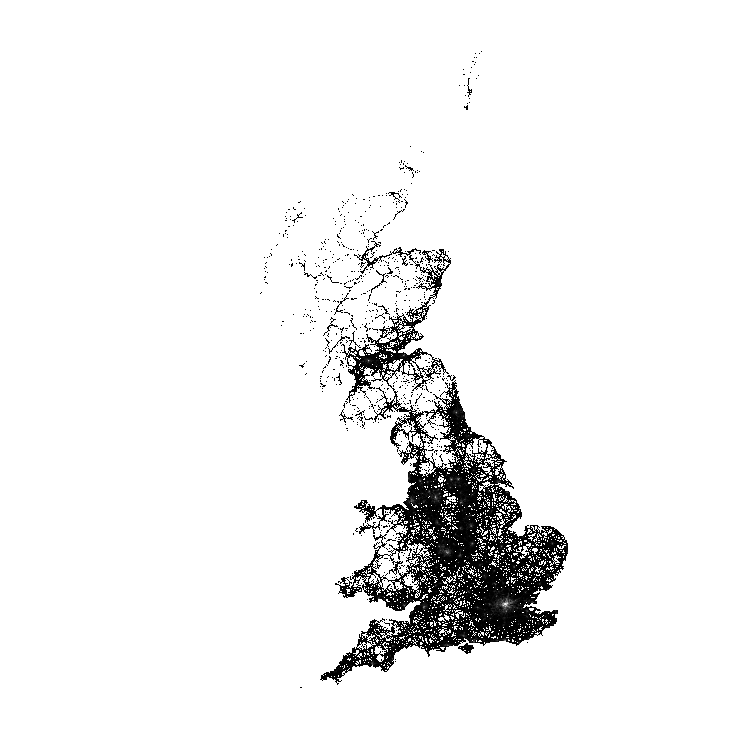

In [21]:
tf.shade(agg, cmap = cm(Greys9), how='linear')

This image shows that our traffic accident data points cover pretty much the entire Britian - the fact that we have accidents reported at nearly every spot in Britian is pretty astonishing.

But wait. Shouldn't we get a black background instead (as we configured previously)? Yes we should - if we had used the utility function `export` that we defined earlier. It will also save the image as a `.png` file under the `export` directory (that we defined in our utility function `export` previously). Let's give it another go (spoiler alert: expect an almost pitch black imge).

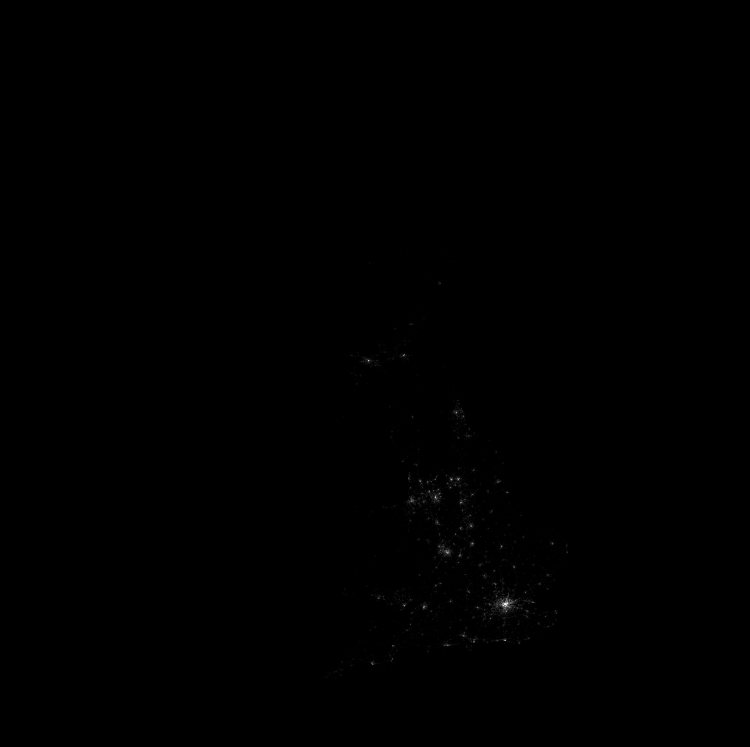

In [22]:
export(tf.shade(agg, cmap = cm(Greys9), how='linear'),"gb_gray_linear")

...almost nothing. If you know what to look for, you can see hotspots (high population densities) in London, Birmingham, Manchester and a few other places. More hotspots can dimly be seen when using a white background than with a black, on most monitors, though they are very dim either way. In any case, for feeding 570k points in, we're getting almost nothing back in terms of visualization.

The first thing we can do is to prevent undersampling. In the plot above, there is no way to distinguish between pixels that are part of the background, and those that have low but nonzero counts; both are mapped to black or nearly black on a linear scale. Instead, let's map all values that are not background to a dimly visible gray, leaving the highest-density values at white. I.e., let's discard the first 25% of the gray colormap, and linearly interpolate the population densities over the remaining range:

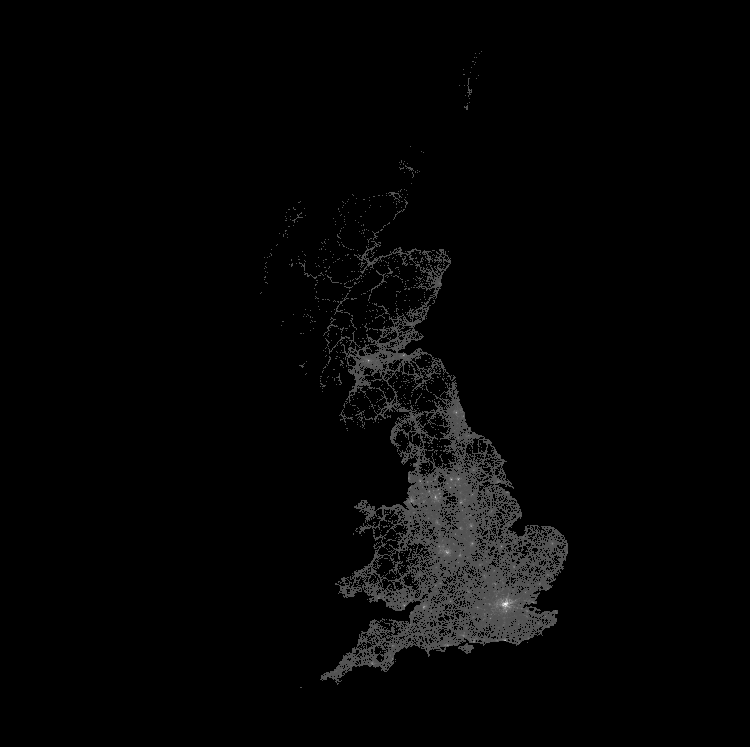

In [23]:
export(tf.shade(agg, cmap = cm(Greys9,0.25), how='linear'),"gb_gray_linear_0.25")

We now get our expected black background, with accident density represented by the tone - the brighter it is, the higher the density. The background color is shown for pixels that have no data at all, using the alpha channel of a PNG image, while the colormap range is shown for pixels that do have data. Some additional concentrations are now visible, at least on some monitors. But mainly what the above plot indicates is that traffic accidents reported in the Great Britian is extremely non-uniformly distributed, with hotspots in a few regions, and nearly all other pixels having much, much lower (but nonzero) values. Again, that's not much information to be getting out out of 570k datapoints.

The problem is that of the available intensity scale in this gray colormap, nearly all pixels are colored the same low-end gray value, with only a few urban areas using any other colors. Thus this version of the map conveys very little information as well. Because the data are clearly distributed so non-uniformly, let's instead try a nonlinear mapping from traffic accident counts into the colormap. A logarithmic mapping is often a good choice:

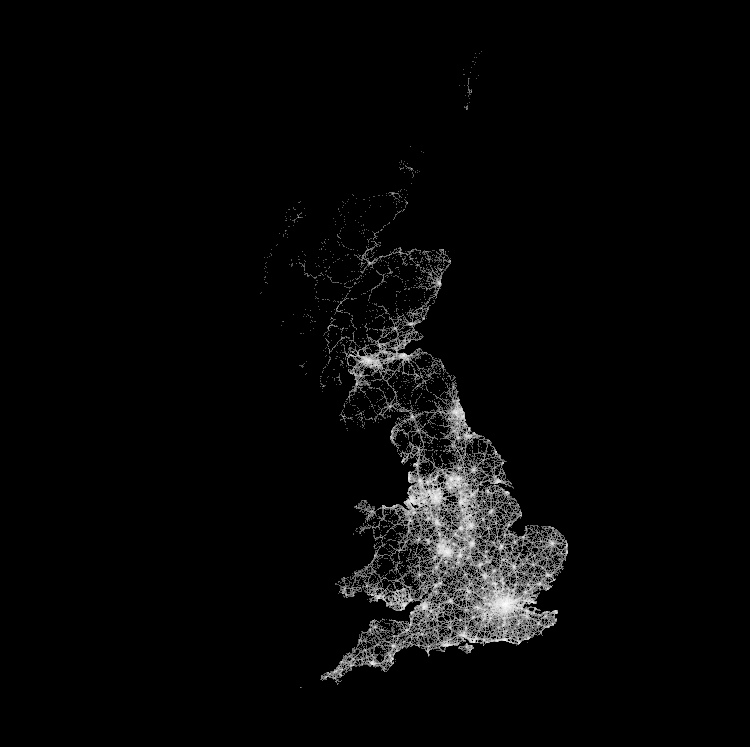

In [24]:
export(tf.shade(agg, cmap = cm(Greys9,0.25), how='log'),"gb_gray_log_0.25")

Suddenly, we can see an amazing amount of structure. There are clearly meaningful patterns at nearly every location, ranging from the sparesly spaced North and West, to the densely spaced urban centers in Greater London, Midlands, and South-east regins.

Clearly, we can now see much more of what's going on in this dataset, thanks to the logarithmic mapping. Worryingly, though, the choice of 'log' was purely arbitrary, basically just a hunch based on how many datasets behave. One could easily imagine that other nonlinear functions would show other interesting patterns, or that different functions would be needed for different datasets.

Instead of blindly searching through the space of all such functions, we can step back and notice that the main effect of the log transform has been to reveal local patterns at all traffic accident densities - small towns show up clearly even if they are just slightly more dense than their immediate, rural neighbors, yet large cities with high traffic accident density also show up well against the surrounding suburban regions, even if those regions are more dense than the small towns on an absolute scale.

With this idea of showing relative differences across a large range of data values in mind, let's try the image-processing technique called [histogram equalization](https://en.wikipedia.org/wiki/Histogram_equalization).

| ![Histogrammeinebnung.jpg](../assets/images/Histogrammeinebnung.jpg) |
|:-:|
|Histograms of an image before and after equalization. [Image Source: Wikipedia](https://en.wikipedia.org/wiki/Histogram_equalization) |

I.e., given a set of raw counts, map these into a range for display such that every available color on the screen represents about the same number of samples in the original dataset. The result is similar to that from the log transform, but is now non-parametric - it will equalize any linearly or nonlinearly distributed integer data, regardless of the distribution:

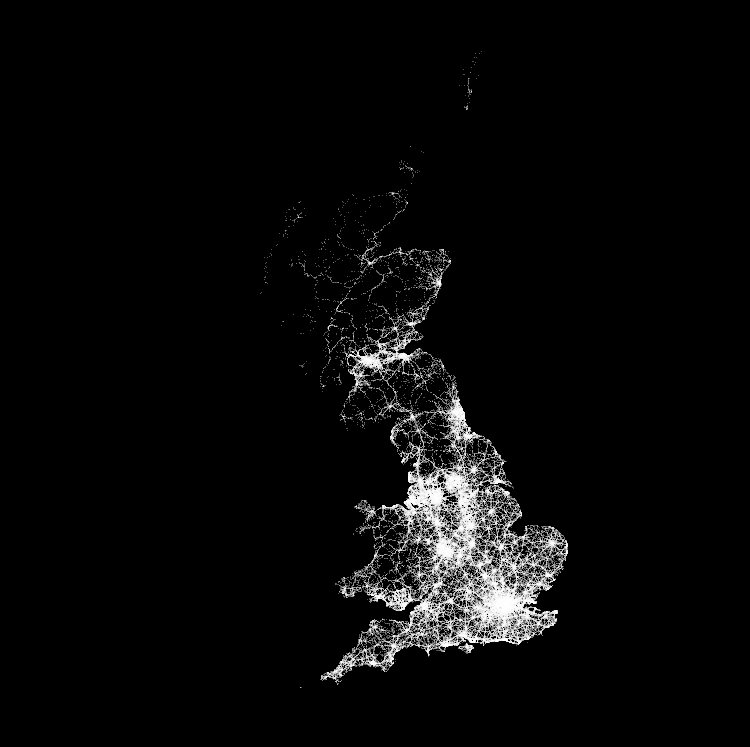

In [25]:
export(tf.shade(agg, cmap = cm(Greys9,0.25), how='eq_hist'),"gb_gray_eq_hist")

(Histogram equalization also works for non-integer data, but in that case it will use a finite set of bins to divide the interval between the minimum and maximum values, and will thus not be able to normalize the histogram perfectly for highly non-uniform distributions.) Effectively, this transformation converts the data from raw magnitudes, which can easily span a much greater range than the dynamic range visible to the eye, to a rank-order or percentile representation, which reveals density differences at all ranges but obscures the absolute magnitudes that were used to compute the ordering. In this representation, you can clearly see the effects of geography (rivers, coastlines, and mountains) on the traffic accident density, as well as history (denser near the most-travelled areas), and even infrastructure (with many small towns located at crossroads).

> Given the very different results from the different types of plot, a good practice when visualizing any dataset with datashader is to look at both the linear and the histogram-equalized versions of the data

**the linear version preserves the magnitudes, but obscures the distribution, while the histogram-equalized version reveals the distribution while preserving only the order of the magnitudes, not their actual values.** If both plots are similar, then the data is distributed nearly uniformly across the interval. But much more commonly, the distribution will be highly nonlinear, and the linear plot will reveal only the envelope of the data, i.e., the lowest and the highest values. In such cases, the histogram-equalized plot will reveal much more of the structure of the data, because it maps the local patterns in the data into perceptible color differences on the screen.

Because we are only plotting a single dimension, we can use the colors of the display to effectively reach a higher dynamic range, mapping ranges of data values into different color ranges. When doing so, it is crucial to use a perceptually uniform colormap (see [this paper](https://arxiv.org/pdf/1509.03700v1.pdf) for more details). Here we'll use the "fire" colormap from the `colorcet` package:

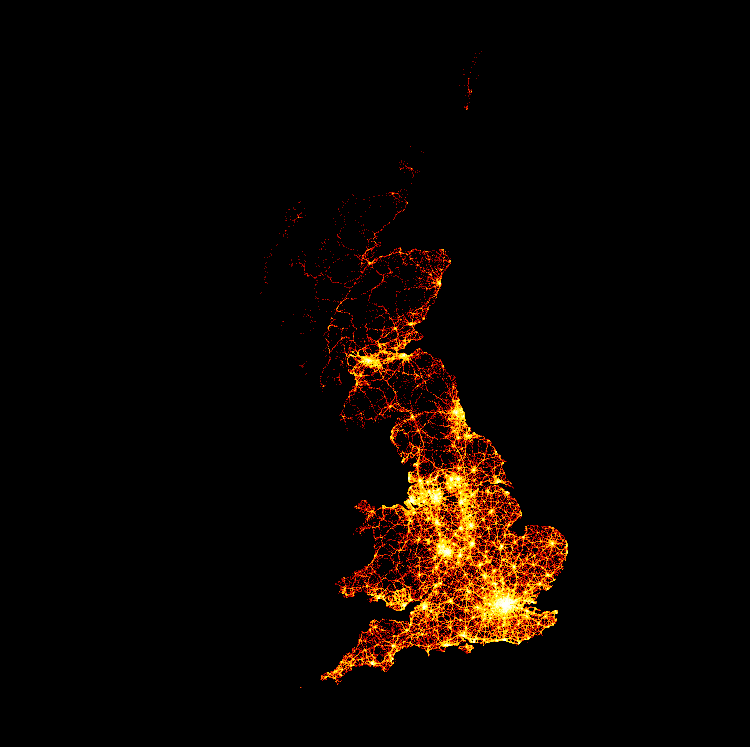

In [26]:
# from colorcet import fire
export(tf.shade(agg, cmap=cm(fire, 0.25), how='eq_hist'),"gb_fire_eq_hist_0.25")

This should reveal even more of the detail than the gray colormaps above.

You can also import colormaps directly from `matplotlib.cm` or `bokeh.palettes`, but only a few of those will be perceptually uniform. For instance, matplotlib's "hot" colormap is similar to colorcet's "fire", but reveals far less of the detail available in this data because it has long stretches of perceptually equivalent colors:

/Users/johnny/anaconda/envs/ds2/lib/python3.6/site-packages/matplotlib/colors.py:489: RuntimeWarning: invalid value encountered in less
  np.copyto(xa, -1, where=xa < 0.0)


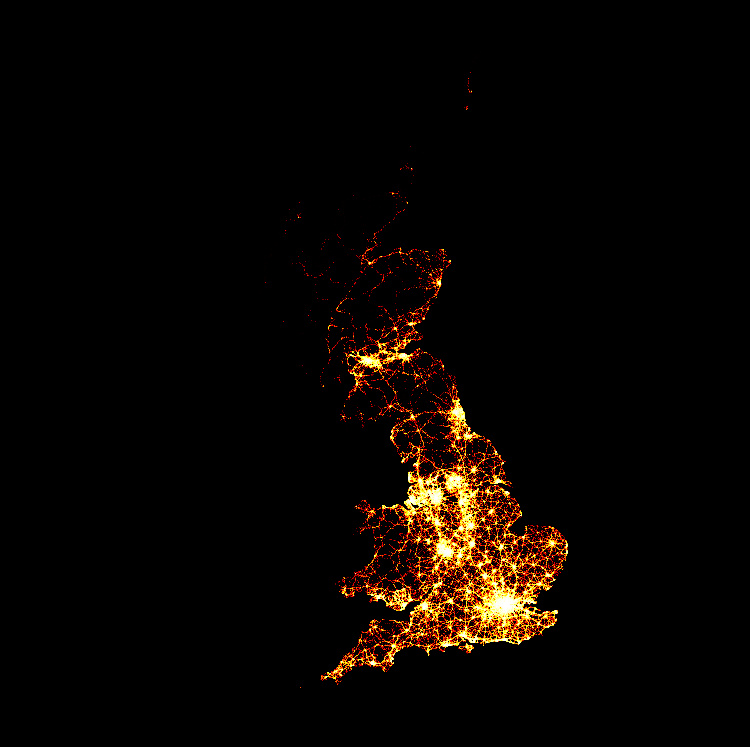

In [27]:
# from matplotlib.cm import hot
export(tf.shade(agg, cmap=hot, how='eq_hist'),"census_mplhot_eq_hist")

Also note that the `cm()` function used here that lets us switch backgrounds and prevent undersampling only supports Bokeh palettes (either provided by Bokeh or from colorcet), though we can find Bokeh-palette versions of matplotlib's perceptually uniform viridis and inferno colormaps from within datashader:

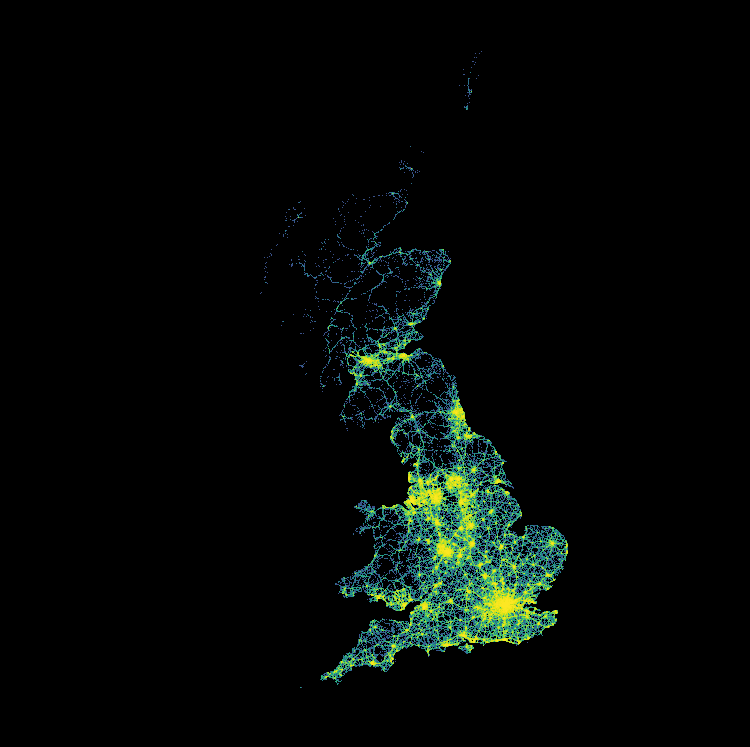

In [28]:
# from datashader.colors import viridis
export(tf.shade(agg, cmap=cm(viridis, 0.25), how='eq_hist'),"gb_viridis_eq_hist_0.25")

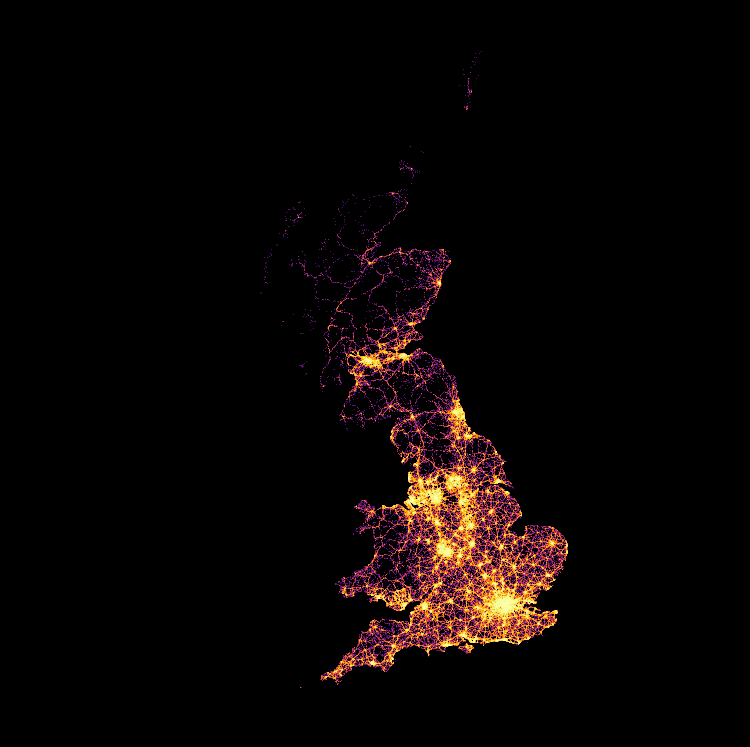

In [29]:
# from datashader.colors import inferno
export(tf.shade(agg, cmap=cm(inferno, 0.25), how='eq_hist'),"gb_inferno_eq_hist_0.25")

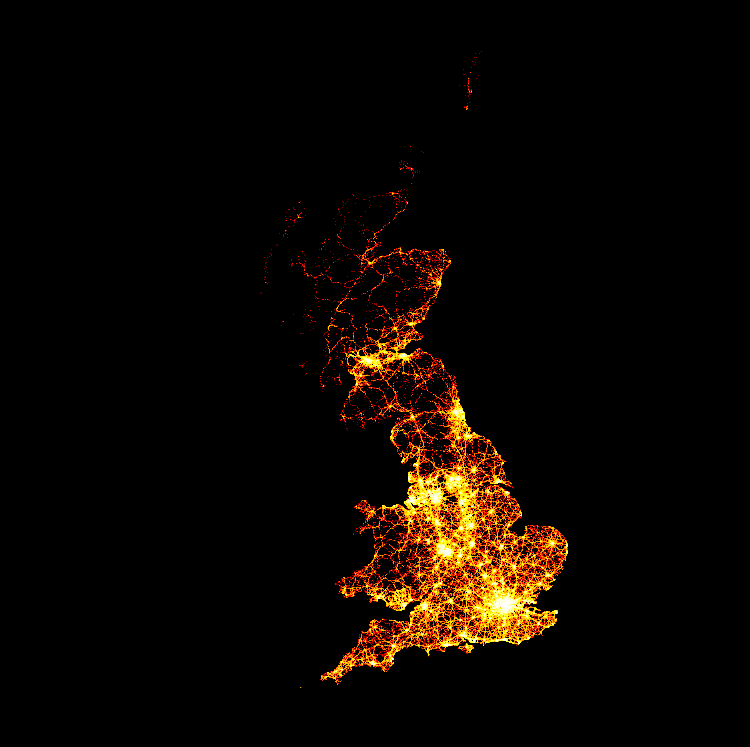

In [30]:
# from datashader.colors import Hot
export(tf.shade(agg, cmap=cm(Hot, 0.25), how='eq_hist'),"gb_Hot_eq_hist_0.25")

For plotting magnitudes of this type, it should be safe to use any of the "linear" colormaps from the colorcet package, depending on your preference.

(Also, personally, I find the datashader `Hot` color map the most suitable displaying distributions - just a personal preference)

<a id="top-1-pct-traffic-accidents-reported"></a>
### Where were the top 1% traffic accidents reported during 2005-2007?

Colormaps can be used to address very specific questions about the data itself. For instance, after histogram equalization, data should be uniformly distributed across the visible colormap. Thus if we want to highlight e.g. the top 1% of pixels, by traffic accident density, we can use a colormap divided into 100 ranges, and just change the top one to a different color:

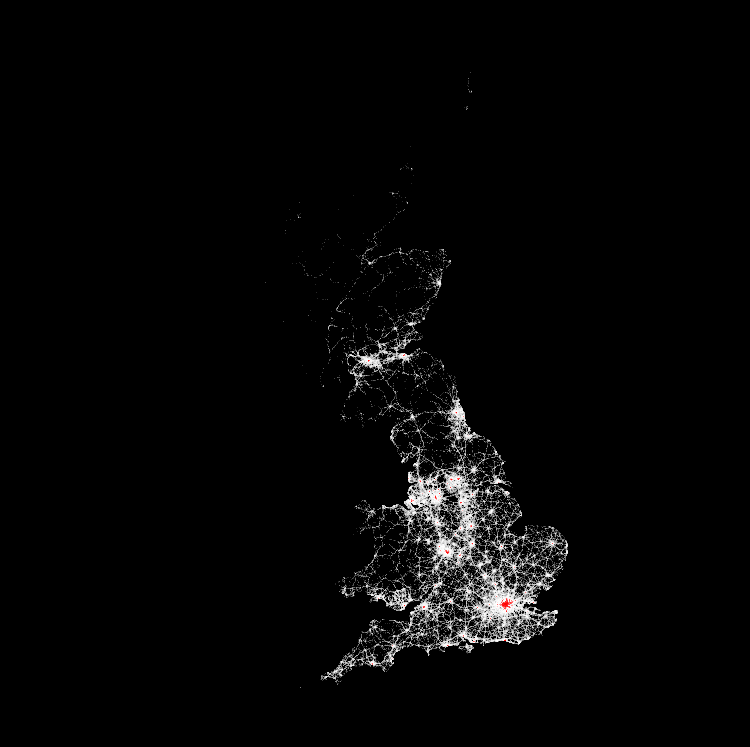

In [31]:
top_x_percent = 1  # change this to 5 for top 5%, etc.

grays2 = cm([(i,i,i) for i in np.linspace(0,255,(100-top_x_percent))])
grays2 += ["red"]
export(tf.shade(agg, cmap=grays2, how='eq_hist'),"gb_gray_redhot1_eq_hist")

**Observation: we can clearly see the top 1% of accidents reported occur in these major cities:**

- England: London, Birmingham, Liverpool, Manchester, Leeds, Newcastle, Noriwch, and Bristol
- Wales: Cardiff.
- Scotland: Edinburgh, Glassgow, Aberdeen

The above plot now conveys nearly all the information available in the linear plot, i.e. that only a few pixels have the very highest population densities, while also conveying the structure of the data at all population density ranges via histogram equalization. And in no case was any parameter value chosen based on the data itself, just on the question we wanted to ask about the data, which is crucial for posing and answering questions objectively using visualizations.

<a id="Plot-Other-Bounding-Boxes"></a>
## Plot Other Bounding Boxes

Remember our other bounding boxes? We can easily plot similar maps for those specific regions too. It's pretty much the same process. Just refresh our 4 core variables `x_range`, `y_range`, `plot_width`, and `plot_height` with our utility function `get_plot_params`. 

In [32]:
# take a peek at our bounding boxes again (lng, lat)
bboxes

{'gb': ((-15.381, 7.251), (48.749, 61.502)),
 'gb_long': ((-8.745, 2.241), (48.749, 61.502)),
 'gb_mainland': ((-12.129, 5.12), (49.71, 58.745)),
 'gb_wide': ((-21.709, 15.293), (48.749, 61.502)),
 'london': ((-0.643, 0.434), (51.2, 51.761)),
 'london_2': ((-0.1696, 0.013), (51.4546, 51.5519)),
 'london_3': ((-0.133, -0.0235), (51.4741, 51.5322)),
 'manchester': ((-3.049, -1.505), (52.975, 53.865))}

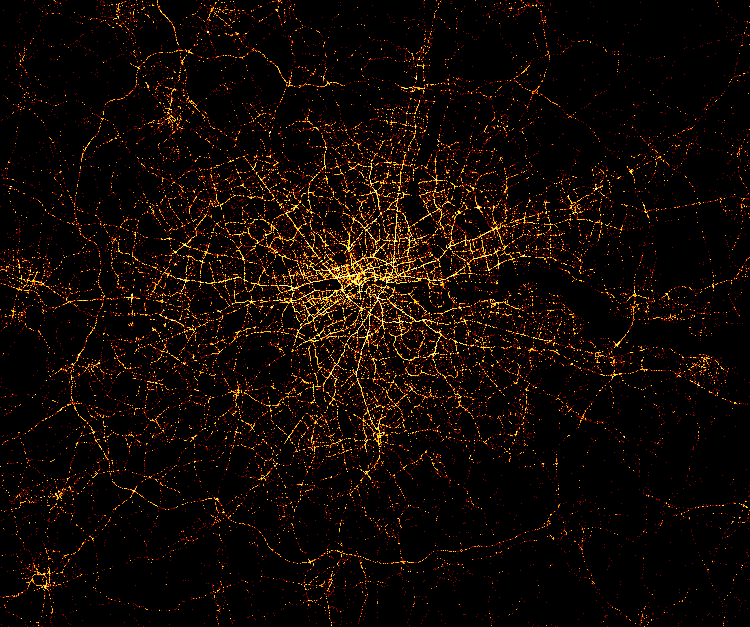

In [33]:
# Let's do London this time
x_range, y_range, plot_width, plot_height = get_plot_params(bboxes["london"])
cvs = ds.Canvas(plot_width, plot_height, x_range, y_range)
agg = cvs.points(df, 'webm_x', 'webm_y')
export(tf.shade(agg, cmap=cm(Hot, 0.25), how='eq_hist'),"london_Hot_eq_hist_0.25")

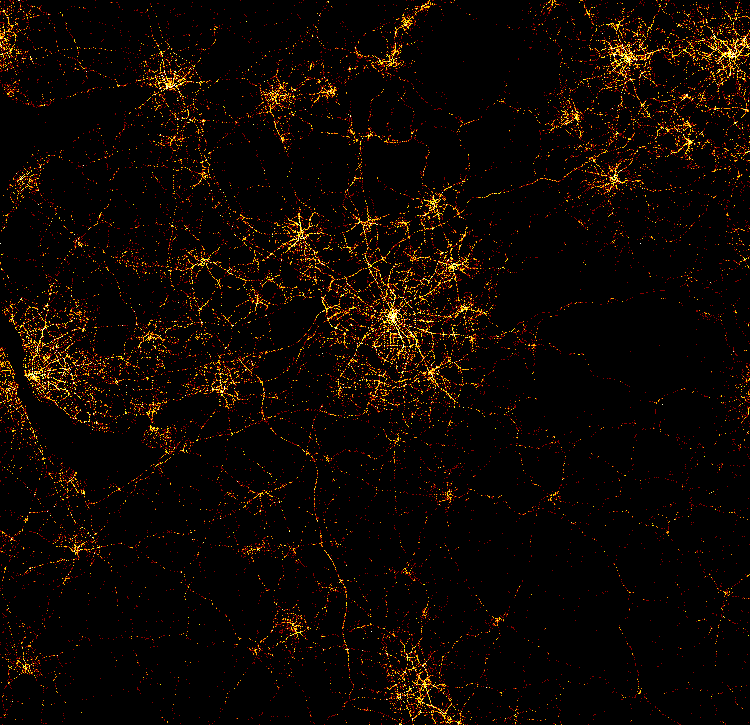

In [34]:
# And do the same for Manchester
x_range, y_range, plot_width, plot_height = get_plot_params(bboxes["manchester"])
cvs = ds.Canvas(plot_width, plot_height, x_range, y_range)
agg = cvs.points(df, 'webm_x', 'webm_y')
export(tf.shade(agg, cmap=cm(Hot, 0.25), how='eq_hist'),"manchester_Hot_eq_hist_0.25")

As you see, with just 4 lines of codes, we get a refreshed plot easily. If we want we can refactor the code further and create more utility functions and reduce it to fewer lines (whatever suits best).

<a id="Interactive-Image"></a>
## Interactive Image

An image at a particular zoom can only tell us so much information. A major feature of datashader is its interactive image capability - you'll be able to visualize traffic accident distribution at various zoom levels dynamically. No data points are lost - if you zoom all the way in you can actually pin-point a specific data point. And when you gradually zoom out, the density visualizations get aggregated dynamically.

Try zoom-in/out, pan left/right/up/down, etc. Use the reset button if needed.

**Note: the dynamic aggregation and rendering only works when the notebook is run locally on a machine. If it is hosted on a server there is a high chance that the image is render as static - you will still be able to interact with the plot with the zoom and pan tools, it just won't do the dynamic aggregation and rendering.**

The coding pattern includes 3 steps (which we shall soon get very familiar with):

1. Create a re-usable Bokeh Base Plot that defines the Web Mercator X and Y Ranges, and Plot Size (Width and Height)
2. Create a callback function so Datashader "knows" how to do the dynamic aggregation and rendering of plot
3. Create the Interactive Image with Datashader Bokeh Extension

<a id="Prerequisite-Enable-JavaScript-support"></a>
### Prerequisite: Enable JavaScript support

To make interactive notebook work, we need to enable JavaScript support with the `bokeh.plotting.output_notebook` method. Note: this may note work on Kaggle Kernels (I believe Kaggle has disabled JavaScript support at the time of writing). Running locally on a machine is ok though.

In [35]:
# from bokeh.plotting import output_notebook
# if this steps run ok you will see "BokehJS 0.12.10 successfully loaded."
output_notebook()

Loading BokehJS ...

<a id="int-Step-1-Create-a-Base-Plot-Function"></a>
### Step 1: Create Base Plot Function

A Base Plot function defines the Web Mercator `x_range` and `y_range`, and Plot Size (`plot_width` and `plot_height`). You can customize how the plot looks by adding/removing configuration options. For example, the `p.axis.visible=False` tells our plot not to include axis.

In [36]:
# from bokeh.plotting import figure
def base_plot(x_range, y_range, plot_width, plot_height,
              tools='pan, wheel_zoom, reset, save', **plot_args):
      
    p = figure(
      x_range=x_range,
      y_range=y_range,
      plot_width=plot_width,
      plot_height=plot_height,
      tools=tools,
      outline_line_color=None,
      min_border=0,
      min_border_left=0,
      min_border_right=0,
      min_border_top=0,
      min_border_bottom=0,
      **plot_args)
    
    p.axis.visible = False 
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

<a id="int-Step-2-Create-a-Callback-Function"></a>
### Step 2: Create Callback Function

A Base Plot function defines the Web Mercator `x_range` and `y_range`, and Plot Size (`plot_width` and `plot_height`). You can customize how the plot looks by adding/removing configuration options. For example, the `p.axis.visible=False` tells our plot not to include axis.

Note: The format of the callback function is documented in the [GitHub code](https://github.com/bokeh/datashader/blob/master/datashader/bokeh_ext.py)

TL;DL

```
fn(x_range=(xmin, xmax), y_range=(ymin, ymax),w, h, **kwargs)
```

In [37]:
# import datashader as ds
# from datashader import transfer_functions as tf

# format...
# fn(x_range=(xmin, xmax), y_range=(ymin, ymax),w, h, **kwargs)
def create_image(x_range, y_range, w, h):
    cvs = ds.Canvas(x_range=x_range, y_range=y_range, plot_width=w, plot_height=h)
    agg = cvs.points(df, 'webm_x', 'webm_y',  ds.count())
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)

<a id="int-Step-3-Create-the-Interactive-Plot"></a>
### Step 3: Create the Interactive Plot

Here we will explore many ways to plot Interactive plots:

- 3-liner solution: good for understanding and learning.
- 2-liner solution: keep things tidy with tuple destructuring. Avoid redundent variable declarations.
- 1-liner solution: makes experimenting / plotting different bounding boxes easy.

All 3 methods have their own merits. Use the one most suitable to your needs. All the codes end with a line like this:

```
InteractiveImage(my_base_plot, my_call_back_function)
```

This is the line that builds the interactive image. You can use the pan and zoom tools to visualise how the points get aggregated and rendered. Use the save button to download the image at a particular zoom level. Use the reset button at anytime to view the original bounding box.

**Important Note: It turns out an InteractiveImage occupy significant disk storage. For this reason, I've commented out the `InteractiveImage(...)` line for now, and use `export(...)` instead to show what the image looks like. If you are running locally on your machine, feel feel to uncomment it and play with it.**

<a id="3-liner-solution-good-for-learning"></a>
#### 3-liner solution: good for learning

Just to make the code more explicit and easy to understand, we can plot this in 3 lines of code.

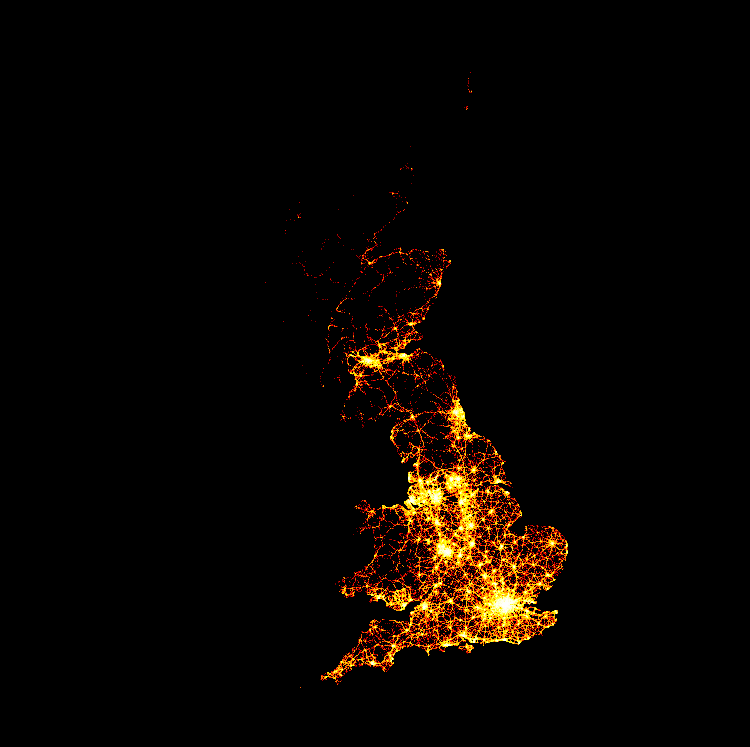

In [38]:
# We will use our Britian example this time
x_range, y_range, plot_width, plot_height = get_plot_params(bboxes["gb"])
p = base_plot(x_range, y_range, plot_width, plot_height, background_fill_color=background)

# Uncomment the last line to create InteractiveImage. Commented out for now to save disk space.
export(create_image(x_range, y_range, plot_width, plot_height), "gb_interactive_3_liner")
# InteractiveImage(p, create_image)

<a id="2-liner-solution-more-compact"></a>
#### 2-liner solution: more compact

The above code can be made even more compact with tuple destructuring style, reducing the code to 2 lines. Another benefit of this style is we avoid the need to saturate our global space with our extra variables (`x_range`, `y_range`, `plot_width` and `plot_height`).

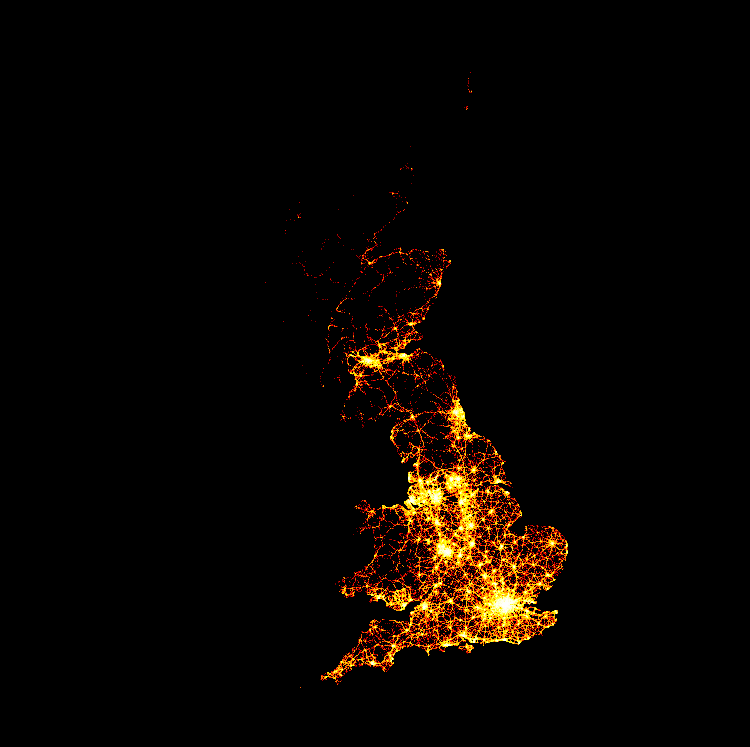

In [39]:
p = base_plot(*get_plot_params(bboxes["gb"]), background_fill_color=background)
export(create_image(x_range, y_range, plot_width, plot_height), "gb_interactive_2_liner")
# InteractiveImage(p, create_image)

<a id="1-liner-solution-good-for-plotting-other-bounding-boxes"></a>
#### 1-liner solution: good for plotting other bounding boxes

The 2-liner solution can easily be reduced down to 1 line by hiding the `p` away. Let's reduce this down to one line this time?

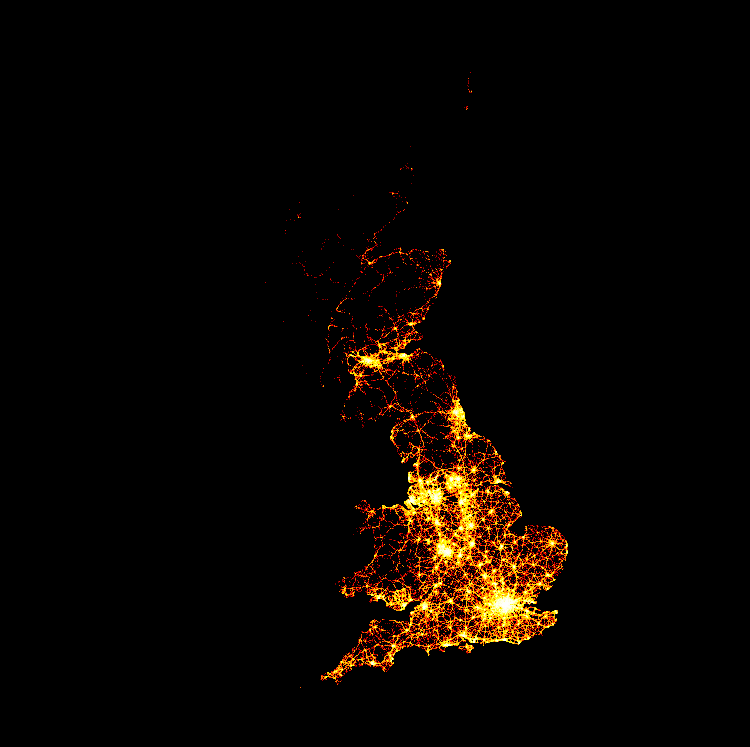

In [40]:
export(create_image(x_range, y_range, plot_width, plot_height), "gb_interactive_1_liner")
# InteractiveImage(base_plot(*get_plot_params(bboxes['gb']), background_fill_color=background), create_image)

<a id="Plot-other-Bounding-Boxes"></a>
### Plot other Bounding Boxes

Now, say we want to plot an interactiv image of other bounding boxes, we can do it in just one line! Note that because we have dynamically re-compute plot parameters with the `get_plot_params` utility function (that we wrote ourself), the plot is not distored (yay). I also personally really like this 1-liner approach - it is very declarative, encapsulating a lot of imperative details away. (functinal programming style - with the use of callbacks).

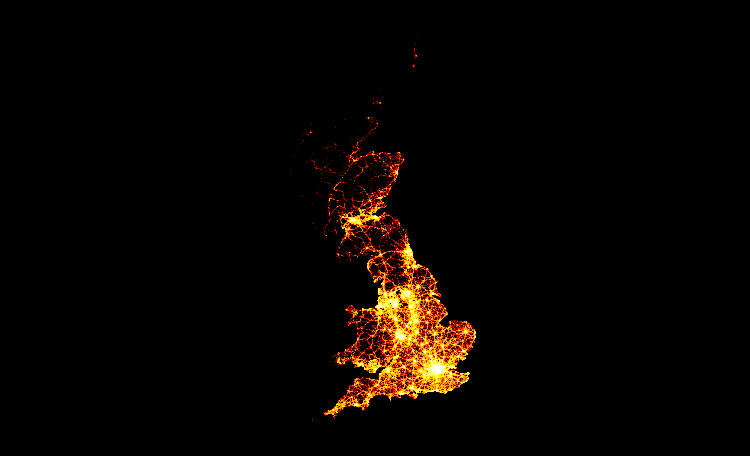

In [41]:
# wide plot
export(create_image(*get_plot_params(bboxes["gb_wide"])), "gb_wide")
# InteractiveImage(base_plot(*get_plot_params(bboxes["gb_wide"]), background_fill_color=background), create_image)

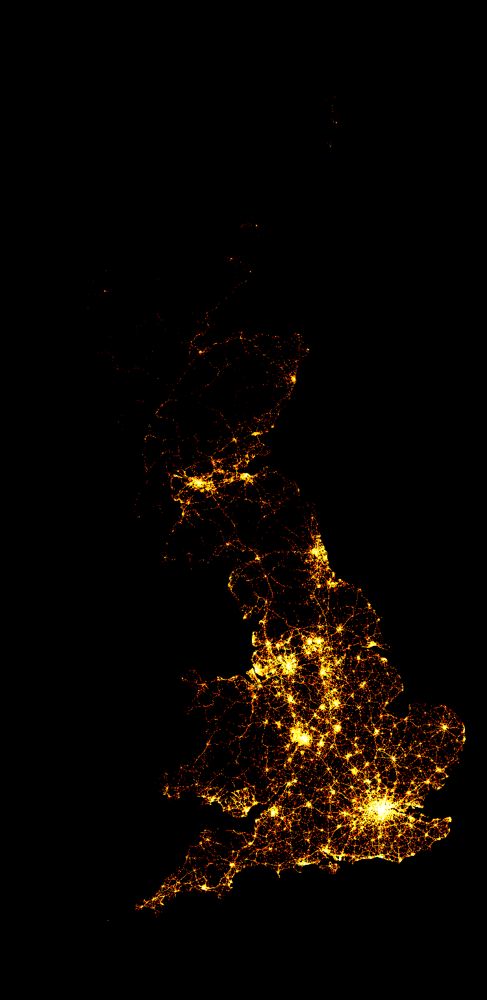

In [42]:
# long plot
export(create_image(*get_plot_params(bboxes["gb_long"])), "gb_long")
# InteractiveImage(base_plot(*get_plot_params(bboxes["gb_long"]), background_fill_color=background), create_image)

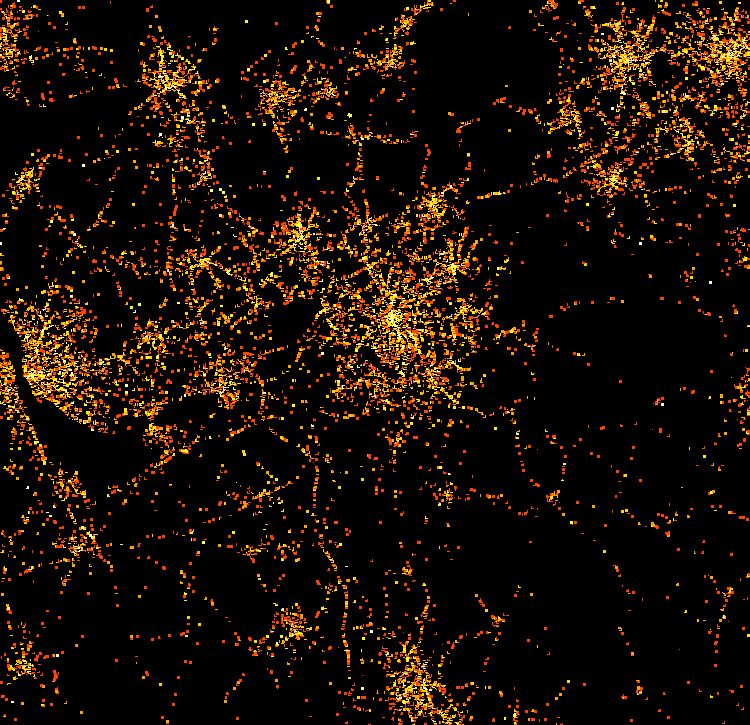

In [43]:
# Manchester
export(create_image(*get_plot_params(bboxes["manchester"])), "manchester")
# InteractiveImage(base_plot(*get_plot_params(bboxes["manchester"]), background_fill_color=background), create_image)

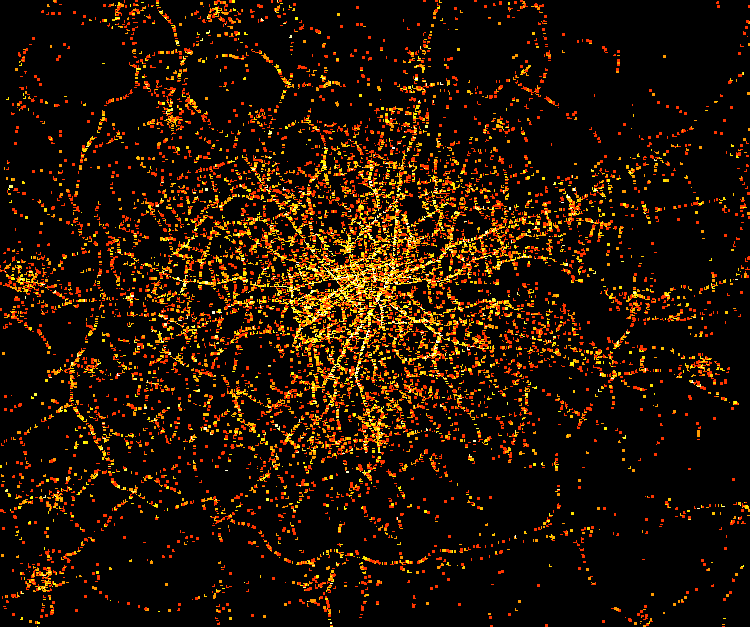

In [44]:
# London
export(create_image(*get_plot_params(bboxes["london"])), "london")
# InteractiveImage(base_plot(*get_plot_params(bboxes["london"]), background_fill_color=background), create_image)

<a id="Adjust-Plot-size"></a>
### Adjust Plot size

Say we want to make our plot bigger / smaller, we just need to parse in our `plot_width`. Thanks to our homemade utility function `get_plot_params`.

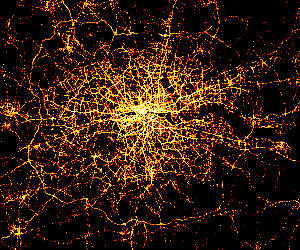

In [45]:
export(create_image(*get_plot_params(bboxes["london"], plot_width=300)), "london")
# InteractiveImage(base_plot(*get_plot_params(bboxes["london"], plot_width=300), background_fill_color=background), create_image)

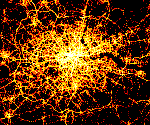

In [46]:
export(create_image(*get_plot_params(bboxes["london"], plot_width=150)), "london")
# InteractiveImage(base_plot(*get_plot_params(bboxes["london"], plot_width=150), background_fill_color=background), create_image)

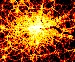

In [47]:
export(create_image(*get_plot_params(bboxes["london"], plot_width=75)), "london")
# InteractiveImage(base_plot(*get_plot_params(bboxes["london"], plot_width=75), background_fill_color=background), create_image)

<a id="Overlay-data-to-a-Terrain-Map"></a>
### Overlay data to a Terrain Map

Sometimes we may want to quickly identify the name of the cities and roads of high (or low) density region. Overlaying our data over a real map will help us greatly. Remember our 3 approaches to plotting an interactive map earlier? The 2 liner approach will work very well here (and insert an extra line in between). Try zoom in/out and see the dynamic changes in the map. Use the reset button every now and then to reset view.

**Note: this demo only works when you run the notebook locally. If you are viewing this notebook from a server, there is a high chance that the rendered image is static**.

Let plot Britian.

In [48]:
# from bokeh.tile_providers import STAMEN_TERRAIN
p = base_plot(*get_plot_params(bboxes["gb"]), background_fill_color=background)
p.add_tile(STAMEN_TERRAIN)  # overlay our plot on a STAMEN_TWERRAIN map
InteractiveImage(p, create_image)

What about just London this time? (use the reset button to zoom into the appropriate range)

In [49]:
# zoom in more
p = base_plot(*get_plot_params(bboxes["london_2"]), background_fill_color=background)
p.add_tile(STAMEN_TERRAIN)  # overlay our plot on a STAMEN_TWERRAIN map
InteractiveImage(p, create_image)

Notice that majority of the traffic accidents occur just North and South of the River Thames, in Central London.

<a id="Visualize-Traffic-Accident-Density-by-Road-Type"></a>
## Visualize Traffic Accident Density by Road Type

Occasionally we may want to ask question like this:

> what road types are most proned to traffic accidents?

Let's do a quick summary of our dataset, group by `Road_Type`.

In [50]:
df.groupby(['Road_Type']).size()

Road_Type
Dual carriageway       87274
One way street         12434
Roundabout             36637
Single carriageway    423414
Slip road               5936
Unknown                 4316
dtype: int64

Here, we see that majority of traffic accidents occur along the [Singe Carriageway](https://en.wikipedia.org/wiki/Single_carriageway) (~423k accidents), followed by [Dual Carriageway](https://en.wikipedia.org/wiki/Dual_carriageway) (~87k accidents), followed by [Roundabout](https://en.wikipedia.org/wiki/Roundabout) (~36k accidents), etc.

With Datashader and Bokeh, we can easily visualize these statistics on a map (which in our case, the Web Mercator Projection). The prodecure is similar:

1. define a color for each category (Road Type in this case).
2. create a base plot with Bokeh (which we have done already earlier).
3. create a callback function for datashader Interactive Image. The format of this callback function has the same format as the `create_image` we defined earlier. 
4. plot the interactive map with `InteractiveImage`
5. overlay on a map (optional)

Note the very repeatable and familiar pipeline.

<a id="by-type-Step-1-Define-Color-Key"></a>
### Step 1: Define Color Key

We assign each road type with a unique color. I will use the classic Rainbow color for simplicity. For example, all Dual Carriageway related accidents will be colored in red.

In [51]:
# https://bokeh.pydata.org/en/latest/docs/reference/colors.html
color_key = {
  'Dual carriageway':'red',
  'One way street':'orange',
  'Roundabout':'yellow',
  'Single carriageway':'green',
  'Slip road':'blue',
  'Unknown':'purple'
}

<a id="by-type-Step-2-Define-Base-Plot"></a>
### Step 2: Define Base Plot

We've already created a Base Plot function this earlier. Scroll back up and review our `base_plot` function. [click here to see the base_plot function](#int-Step-1-Create-a-Base-Plot-Function). It's all there.

<a id="by-type-Step-3-Define-Callback-Function"></a>
### Step 3: Define Callback Function

Here, we define our familiar datashader callback function. They all look something like this. We create a `cvs` (Canvas), `agg` (Aggregation), and `img` (Image), and return the `img` with a bit of manipulation. One major difference of this callback function is this line:

```
agg = cvs.points(df, 'webm_x', 'webm_y',  ds.count_cat('Road_Type'))
```

Note that we are computing traffic accident density (accidents per x-y coordinate region), by `Road_Type`. This is the magic sauce to give us different color for each `Road_Type`.

In [52]:
def agg_by_road_type(x_range, y_range, w=plot_width, h=plot_height):
  cvs = ds.Canvas(x_range=x_range, y_range=y_range, plot_width=plot_width, plot_height=plot_height)
  agg = cvs.points(df, 'webm_x', 'webm_y',  ds.count_cat('Road_Type'))
  img = tf.shade(agg, cmap=Hot, color_key=color_key, how='eq_hist')
  return tf.dynspread(img, threshold=0.5, max_px=4)

<a id="by-type-Step-4-Create-Interactive-Plot"></a>
### Step 4: Create Interactive Plot

Here we go. We have everything we need to plot the statistics. Let's plot "London" do start with. 

In [53]:
p = base_plot(*get_plot_params(bboxes["london"]), background_fill_color=background)
# p.add_tile(STAMEN_TERRAIN)  # overlay our plot on a STAMEN_TWERRAIN map
InteractiveImage(p, agg_by_road_type)

We can clearly see from the above plot what we concluded earlier. i.e. Majority of traffic accidents occur along:

- **Single carriageway** (Green): pretty much everywhere
- **Dual carriageway** (red): note the distinctive and iconic ring road structures! The outer ring is M25, and the inner ring is the S. Circular.
- **Roundabout** (yellow): note all the unconnected yellow dots

We can also see some on the slip way (blue) on the west and north-east, of the M25 Dual Carriageway.

<a id="by-type-tep-5-Overlay-on-a-Map"></a>
### Step 5: Overlay on a Map

This step is optional. Say we wish to hunt down the location of the accidents, we can do what we did previously - overlay the plot on a map. Note the code is exactly the same, with one extra line (`add_tile`) in between.

In [54]:
p = base_plot(*get_plot_params(bboxes["london"]), background_fill_color=background)
p.add_tile(STAMEN_TERRAIN)  # overlay our plot on a STAMEN_TWERRAIN map
InteractiveImage(p, agg_by_road_type)

If you see some giant black dots, they are just part of the map (e.g. labels). Try do some pan and zoom and visualize how the data get aggregated and rendered. Use the reset button when done.

<a id="Visualize-other-bounding-boxes-by-Road-Type"></a>
### Visualize other bounding boxes by Road Type

To plot other bounding boxes, all we need to do is to invoke our step 4: plot the thing. (no need to re-define base plot and callbacks.) Let's try visualize accidents by Road types across the entire continent Britian this time.

In [55]:
p = base_plot(*get_plot_params(bboxes["gb_mainland"]), background_fill_color=background)
# p.add_tile(STAMEN_TERRAIN)  # overlay our plot on a STAMEN_TWERRAIN map
InteractiveImage(p, agg_by_road_type)

Note the distinctive Dual Carriageway (red) structure. We can clearly see the iconic London M25 ring road, the two Northbound M26 and A1 connecting London to Scotland, etc. Note that Traffic Accidents are everywhere in the Britian. It is real. Data doesn't lie.

As usual, we can overlay our plot to a map. (You may need to hit the Reset button / zoom in to view plot structure).

In [56]:
p = base_plot(*get_plot_params(bboxes["gb_mainland"]), background_fill_color=background)
p.add_tile(STAMEN_TERRAIN)  # overlay our plot on a STAMEN_TWERRAIN map
InteractiveImage(p, agg_by_road_type)

We have now successfully visualized traffic accident density in the UK, by the Road Type category.

<a id="Conclusion"></a>
## Conclusion

If you have read till this far, thank you for bearing with me and I hope you've enjoyed reading it. You've now been introduced some of the big data visualization capabilities of Bokeh and Datashader. We have only touched the surface and I'd highly recommend you to have a play with the tools and data.

<a id="What-Next"></a>
## What next

There are infinity amount of things we can try out. On top of my mind I could think of the followings. Feel free and add some of your own.

- maybe create a library that stores our utility functions? (so we don't need to write again. Instead, just import).
- when zoom in to an individual accident event point, display accident details (e.g. accident ID, road condition, etc) when we hoever the cursor over the point / click on it.
- a scroll bar corresponding to year (or month). When we scroll along the timeline, we get a refreshed map plot (showing how trend changes over time).
- Can we also show time-series statistics in the form of a line chart? e.g. overall traffic accidents increase / decline over time? By categories as well?
- do similar analysis against other categories? (weather condition?)
- we've only looked at the traffic accident dataset. In that same kaggle page, we can also see another dataset for traffic flow statistics. Try visualizing that dataset too? Can we combine / overlay both datasets (traffic flow vs traffic accidents?).
- can we perform some predictive analytics? e.g. given a combination of variables (e.g. road type, weather condition, etc), what might be the possible traffic accident rate be like? This could be handy for proactive risk management and resource planning.
- can we correlate traffic accidents with major events? e.g. Foodball match? Bon Fire Nights? New Year?
- etc.